In [4]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import matplotlib.patches as patches

In [5]:
torch.cuda.empty_cache()

In [6]:
# pip install git+https://github.com/facebookresearch/segment-anything.git

import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

sam_predictor = SamPredictor(sam)

In [13]:
def read_imag(file_path,size_resize1,size_resize2):
    name_img = os.path.basename(file_path)
    name_img, ext = os.path.splitext(name_img)
    print(name_img)
    if os.path.exists(file_path):
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        image =cv2.resize(img, (size_resize1,size_resize2))
      #  image11 = 255 * (image1 - image1.min()) / (image1.max() - image1.min())
    else:
        print("File not found:", file_path)
    return image,name_img

In [14]:
import pandas as pd
metric = pd.read_csv('result_LEVIR.csv')
print(np.max(metric['F1_score']))
metric['F1_score'].idxmax()

0.6953678971759925


76

In [15]:
size_resize1 = 1024
size_resize2 = 512
#file_path_1 = '/home/dock/urban_positives/1241/2009.png'
#file_path_2 = '/home/dock/urban_positives/1241/2015.png'
names=['image_RuaQuatro110_4845','image_TrilhodeSãoBento60_4845_023RioCaldo','ParqueNacionaldaPeneda_Geres4845_062Geres','image_4850_053Caniçada']
file_path_1 = '/home/dock/project_CD_jupyter/my_project_env/Meta_repository/image_RuaQuatro110_4845_020RioCaldo/Jun2018.jpg'  #test_LEVIR_CD/A/test_80.png'
file_path_2 = '/home/dock/project_CD_jupyter/my_project_env/Meta_repository/image_RuaQuatro110_4845_020RioCaldo/Jun2023.jpg'  #test_LEVIR_CD/B/test_80.png'
#file_path_3 = '/home/dock/project_CD_jupyter/my_project_env/Meta_repository/image_4850_053Caniçada/Jun2023.jpg' 

image1,name_img1 = read_imag(file_path_1,size_resize1,size_resize2)
image2, name_img2 = read_imag(file_path_2,size_resize1,size_resize2)
#image3, name_img3 = read_imag(file_path_3,size_resize)

image_type = type(image1)
print(f"Image Type (using type()): {image_type}")
# Check the data type of the NumPy array
image_dtype = image1.dtype
print(f"Image Data Type (using dtype): {image_dtype}")


'''
from skimage import color
from skimage import io
image1_gray = color.rgb2gray(io.imread(file_path_1))
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

from PIL import Image
image1_gray = Image.open(file_path_1).convert('L')
print("min and max in image1", [np.min(image1_gray), np.max(image1_gray)])
print("min and max in image2", [np.min(image2_gray), np.max(image2_gray)])
'''

Jun2018
Jun2023
Image Type (using type()): <class 'numpy.ndarray'>
Image Data Type (using dtype): uint8


'\nfrom skimage import color\nfrom skimage import io\nimage1_gray = color.rgb2gray(io.imread(file_path_1))\nimage2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)\n\nfrom PIL import Image\nimage1_gray = Image.open(file_path_1).convert(\'L\')\nprint("min and max in image1", [np.min(image1_gray), np.max(image1_gray)])\nprint("min and max in image2", [np.min(image2_gray), np.max(image2_gray)])\n'

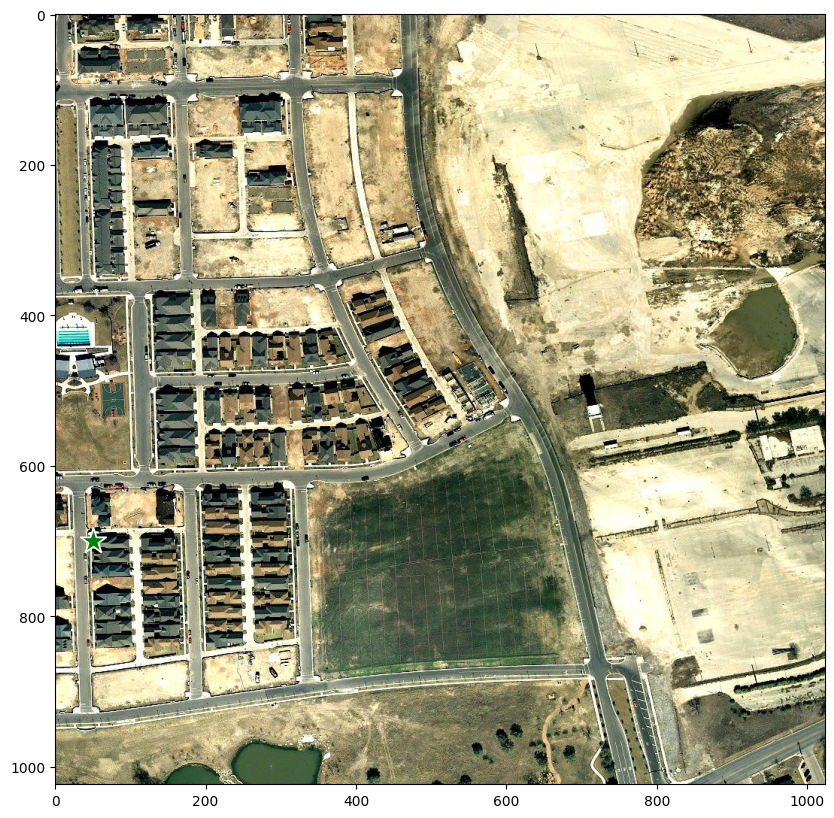

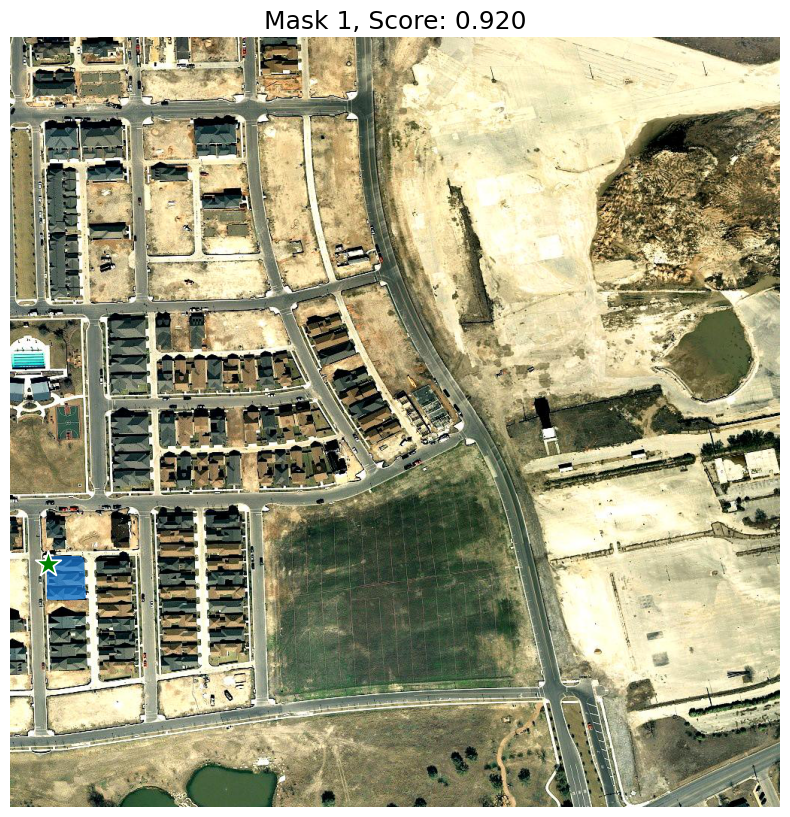

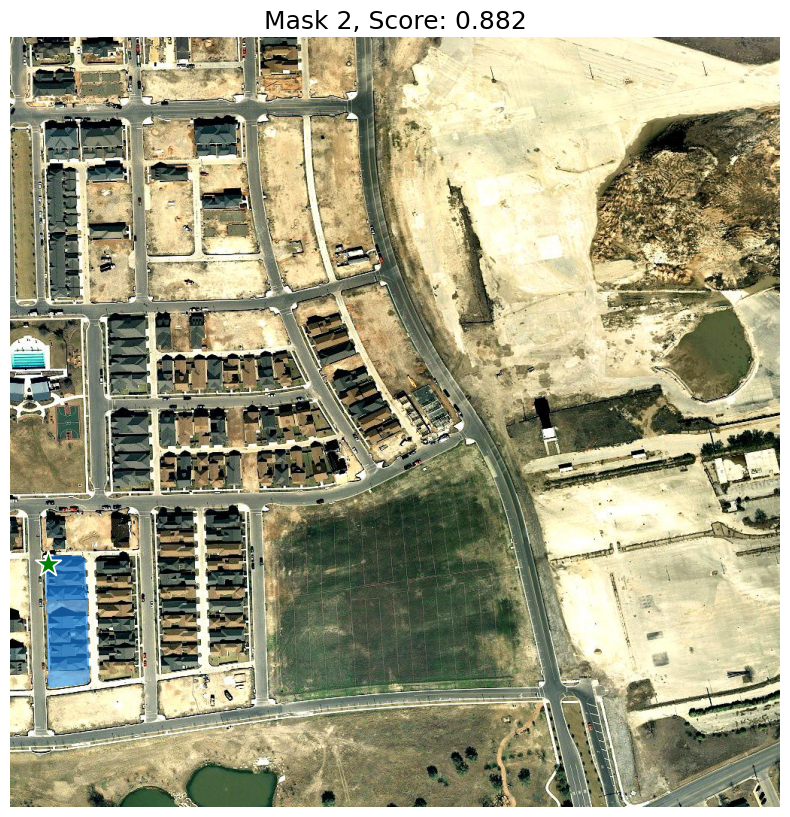

KeyboardInterrupt: 

In [116]:
sam_predictor.set_image(image1)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

input_point = np.array([[50, 700]])
input_label = np.array([1])

plt.figure(figsize=(10,10))
plt.imshow(image1)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()


masks, scores, logits = sam_predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
masks.shape  # (number_of_masks) x H x W


for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image1)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

In [ ]:
!nvcc -V
!gcc --version 

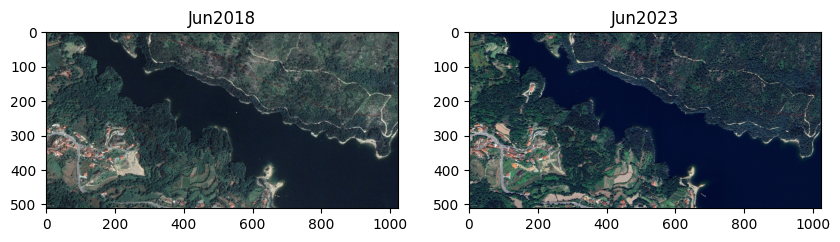

In [16]:
#denoised_image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

f, axs = plt.subplots(1,2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('{}'.format(name_img1))
axs[1].imshow(image2)
axs[1].set_title('{}'.format(name_img2))
plt.show()

In [ ]:
#Tiling images

In [ ]:
'''
from PIL import Image
def tile_image(image_path, tile_width, tile_height):
    # Open the image
    original_image = Image.open(image_path)
    
    # Get the size of the original image
    original_width, original_height = original_image.size
    
    # Calculate the number of rows and columns
    num_cols = original_width // tile_width
    num_rows = original_height // tile_height
    
    # List to store the tiles
    tiles = []
    
    # Iterate over each row and column to extract tiles
    for row in range(num_rows):
        for col in range(num_cols):
            # Calculate the coordinates of the current tile
            left = col * tile_width
            upper = row * tile_height
            right = left + tile_width
            lower = upper + tile_height
            
            # Crop the tile from the original image
            tile = original_image.crop((left, upper, right, lower))
            
            # Append the tile to the list
            tiles.append(tile)
    
    return tiles,num_cols,num_rows

# Example usage
image_name = file_path_1
tile_width = 1000
tile_height = 1000

tiles,num_cols,num_rows = tile_image(image_name, tile_width, tile_height)

# Plotting tiles
#num_cols = 5  # Number of columns in the plot
#num_rows = (len(tiles) + num_cols - 1) // num_cols  # Calculate number of rows

plt.figure(figsize=(10, 10))
for i, tile in enumerate(tiles):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(tile)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Saving tiles
#for i, tile in enumerate(tiles):
 #   tile.save(f"tile_{i}.jpg")
'''

In [ ]:
## Tiling image using ImgTiler
# pip3 install image-tiller
from ImgTiler import SplitImage, CombineTiles
import cv2

img = cv2.imread(file_path_1)
grid = (10, 11) #10 rows, 11 columns
overlap = 10 #30 pixels
show_rect = True
show_image = True

splitter = SplitImage(img, grid, overlap) # Create SplitImage object
tiles2 = splitter.split_image(show_rect=show_rect, show_tiles=show_image) 

combiner = CombineTiles(tiles2, grid, overlap)
img2 = combiner.combine_tiles(show_image=show_image)


## Pre-processing

In [17]:
##stabilizes the brightness and contrast
#1- Gamma Correction
gamma1 = 0.8
gamma_corrected_image1 = np.power(image1 / 255.0, gamma1) * 255.0
image1_GC = np.uint8(gamma_corrected_image1) #gamma_corrected image

gamma2 = 1
gamma_corrected_image2 = np.power(image2 / 255.0, gamma2) * 255.0
image2_GC = np.uint8(gamma_corrected_image2) #gamma_corrected image



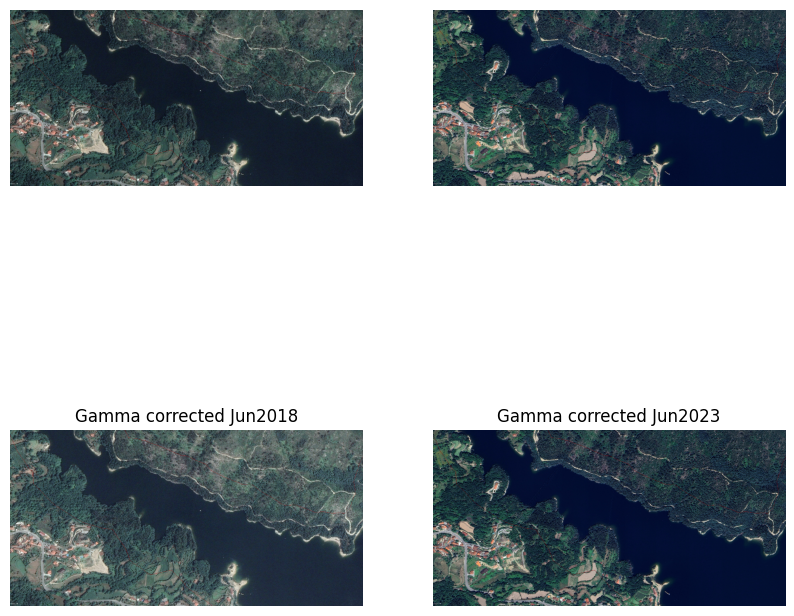

In [18]:
## plot Gamma corrected Images

f, axs = plt.subplots(2,2, figsize=(10, 10))
axs[0,0].imshow(image1)
#axs[0,0].set_title('Image in {}'.format(name_img1))
axs[0,0].set_axis_off()
axs[1,0].imshow(image1_GC)
axs[1,0].set_axis_off()
axs[1,0].set_title('Gamma corrected {}'.format(name_img1))
axs[0,1].imshow(image2)
axs[0,1].set_axis_off()
#axs[0,1].set_title('Image in {}'.format(name_img2))
axs[1,1].imshow(image2_GC)
axs[1,1].set_title('Gamma corrected {}'.format(name_img2))
axs[1,1].set_axis_off()
plt.show()



In [ ]:
print(np.shape(image1))

False


/home/dock/project_CD_jupyter/my_project_env/lib/python3.8/site-packages/skimage/_shared/utils.py:316: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


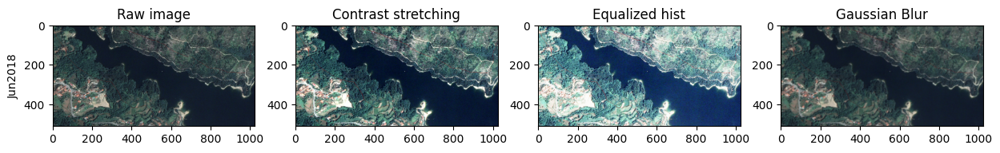

False


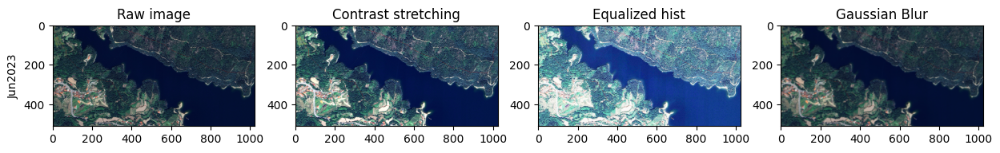

In [19]:
#rescale_intensity
from skimage import exposure, img_as_float
from skimage.util import compare_images

def preprocessing(image):
    p2, p98 = np.percentile(image, (2, 98))
    img_rescale = exposure.rescale_intensity(image, in_range=(p2,p98)) # Contrast stretching
    print(image1.mean() > img_rescale.mean()) # Output is darker for gamma > 1
    #equalize_hist
    img_equalized = exposure.equalize_hist(image)
    img_equalized = (img_equalized* 255).astype('uint8')
    # Gaussian Blur is used to remove the random noise in the image pixel. kernel size=(7,7), and standard deviation = 0
    imag_BlurGaussian = cv2.GaussianBlur(image, (7, 7), 0) 
    #comp_equalized = compare_images(image1, img1_equalized, method='checkerboard')
    return img_rescale, img_equalized,imag_BlurGaussian

def plot_image_preproc(imag,img_rescale,img_equalized,img_BlurGaussian, name_img):
    fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(15, 10))
    ax1.imshow(imag)
    ax1.set_title('Raw image')
    ax1.set_ylabel('{}'.format(name_img))
    ax2.imshow(img_rescale)
    ax2.set_title('Contrast stretching')
    ax3.imshow(img_equalized)
    ax3.set_title('Equalized hist')
    ax4.imshow(img_BlurGaussian)
    ax4.set_title('Gaussian Blur')
    plt.show()

img1_rescale, img1_equalized,img1_BlurGaussian = preprocessing(image1)
plot_image_preproc(image1,img1_rescale,img1_equalized,img1_BlurGaussian,name_img1)

img2_rescale, img2_equalized,img2_BlurGaussian = preprocessing(image2)
plot_image_preproc(image2,img2_rescale,img2_equalized,img2_BlurGaussian,name_img2)


### compare two raw images:

In [ ]:

from scipy.linalg import norm
from scipy import sum, average

def to_grayscale(arr):
    "If arr is a color image (3D array), convert it to grayscale (2D array)."
    #if len(arr.shape) == 3:
   #     return average(arr, -1)  # average over the last axis (color channels)
   # else:
    #    return arr
    return np.dot(arr[...,:3], [0.2989, 0.5870, 0.1140])

def compare_images(img1, img2):
    # normalize to compensate for exposure difference, this may be unnecessary
    # consider disabling it
    img1 =  255 * (img1 - img1.min()) / (img1.max() - img1.min())
    img2 = 255 * (img2 - img2.min()) / (img2.max() - img2.min())
    # calculate the difference and its norms
    diff = img1 - img2  # elementwise for scipy arrays
    m_norm = sum(abs(diff))  # Manhattan norm
    z_norm = norm(diff.ravel(), 0)  # Zero norm
    return (m_norm, z_norm)

img1 = to_grayscale(image1.astype(float))
img2 = to_grayscale(image2.astype(float))
img3 = to_grayscale(image3.astype(float))
# compare
n_m, n_0 = compare_images(img1, img2)
print ("Manhattan norm:", n_m, "/ per pixel:", n_m/img1.size)
print ("Zero norm:", n_0, "/ per pixel:", n_0*1.0/img1.size)

n_m2, n_02 = compare_images(img1, img3)
print ("Manhattan norm:", n_m2, "/ per pixel:", n_m2/img1.size)
print ("Zero norm:", n_02, "/ per pixel:", n_02*1.0/img1.size)
#import ImageChops
#diff = ImageChops.difference(img1, img2)
#print(diff)

##score: {-1:1} measure of the structural similarity between the images
#from skimage import metrics
#score, diff = me

## Structural Similarity Index (SSIM) method:

In [ ]:
from skimage.metrics import structural_similarity
from skimage.color import rgb2gray

#def rgb2gray(rgb):
  #  return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
# Convert images to grayscale
image1_gray = cv2.cvtColor(img1_rescale, cv2.COLOR_RGB2GRAY)
image2_gray = cv2.cvtColor(img2_rescale, cv2.COLOR_RGB2GRAY)
# Compute SSIM between two images
score, diff = structural_similarity(image1_gray, image2_gray, full=True)
print("Similarity Score: {:.3f}%".format(score * 100))

diff = (diff * 255).astype("uint8")

# Threshold the difference image, followed by finding contours to
# obtain the regions that differ between the two images
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
print(thresh)
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]

# Highlight differences
mask = np.zeros(image1.shape, dtype='uint8')
filled = image2.copy()

for c in contours:
    area = cv2.contourArea(c)
    #print(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image1, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.rectangle(image2, (x, y), (x + w, y + h), (36,255,12), 2)
        cv2.drawContours(mask, [c], 0, (0,255,0), -1)
        cv2.drawContours(filled, [c], 0, (0,255,0), -1)
plt.figure(figsize=(5,5))
plt.imshow( image1)
#plt.imshow(image2)
plt.imshow(diff)
#plt.imshow(mask)
#plt.imshow(filled)
plt.show()

In [ ]:
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image2_gray = cv2.cvtColor(image3, cv2.COLOR_BGR2GRAY)
w, h = image2_gray.shape[::-1]

res = cv2.matchTemplate(image1_gray,image2_gray,cv2.TM_CCOEFF_NORMED)
print(np.max(res))
threshold = 0.7
loc = np.where( res >= threshold) 
print(loc)
for pt in zip(*loc[::-1]):
    cv2.rectangle(image1_gray, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)

plt.imshow(image1_gray) #, cmap=plt.get_cmap('gray')
plt.show()

if len(loc[0])>0:
     detection = True
else:
     detection = False
print(detection)

In [ ]:
#segment an image with image labelling" 
'''
1- Thresholding with automatic Otsu method

2- Close small holes with binary closing

3- Remove artifacts touching image border

4- Measure image regions to filter small objects
'''
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb


image = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# apply threshold
thresh = threshold_otsu(image)
print(thresh)
bw = closing(image > thresh, square(3))

# remove artifacts connected to image border
cleared = clear_border(bw)

# label image regions
label_image = label(cleared)
# to make the background transparent, pass the value of `bg_label`,
# and leave `bg_color` as `None` and `kind` as `overlay`
image_label_overlay = label2rgb(label_image, image=image, bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)
for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 100:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle(
            (minc, minr),
            maxc - minc,
            maxr - minr,
            fill=False,
            edgecolor='red',
            linewidth=2,
        )
        ax.add_patch(rect)

ax.set_axis_off()
plt.tight_layout()
plt.show()
masks11 = mask_generator.generate((image_label_overlay).astype(np.uint8))

In [ ]:
#segment an image with image labelling" 
'''
1- Thresholding with automatic Otsu method

2- Close small holes with binary closing

3- Remove artifacts touching image border

4- Measure image regions to filter small objects
'''
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb


image = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# apply threshold
thresh = threshold_otsu(image)
print(thresh)
bw = closing(image > thresh, square(3))

# remove artifacts connected to image border
cleared = clear_border(bw)

# label image regions
label_image = label(cleared)
# to make the background transparent, pass the value of `bg_label`,
# and leave `bg_color` as `None` and `kind` as `overlay`
image_label_overlay2 = label2rgb(label_image, image=image, bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(bw)

plt.show()
#masks22 = mask_generator.generate((image_label_overlay2).astype(np.uint8))

## Generate Masks

In [20]:
masks1 = mask_generator.generate((image1).astype(np.uint8))
masks2 = mask_generator.generate((image2).astype(np.uint8))


## Generate masks for equalized  and blured and Gamma corrected image
masks1_rescaled = mask_generator.generate(img1_rescale.astype(np.uint8))
masks1_equalized = mask_generator.generate(img1_equalized.astype(np.uint8))
masks1_blur = mask_generator.generate(img1_BlurGaussian.astype(np.uint8))
masks1_GC = mask_generator.generate(image1_GC)
print("the number of segments for image1:",len(masks1))
print("the number of segments for rescaled image1:",len(masks1_rescaled))
print("the number of segments for equalized image1:", len(masks1_equalized))
print("the number of segments for blured image1:", len(masks1_blur))
print("the number of segments for Gamma corrected image1:", len(masks1_GC))
print("*"*20)

masks2_rescaled = mask_generator.generate(img2_rescale.astype(np.uint8))
masks2_equalized = mask_generator.generate(img2_equalized.astype(np.uint8))
masks2_blur = mask_generator.generate(img2_BlurGaussian.astype(np.uint8))
masks2_GC = mask_generator.generate(image2_GC)
print("the number of segments for image2:",len(masks2))
print("the number of segments for rescaled image2:",len(masks2_rescaled))
print("the number of segments for equalized image2:", len(masks2_equalized))
print("the number of segments for blured image2:", len(masks2_blur))
print("the number of segments for Gamma corrected image2:", len(masks2_GC))
print("*"*20)


the number of segments for image1: 42
the number of segments for rescaled image1: 43
the number of segments for equalized image1: 45
the number of segments for blured image1: 49
the number of segments for Gamma corrected image1: 42
********************
the number of segments for image2: 53
the number of segments for rescaled image2: 50
the number of segments for equalized image2: 43
the number of segments for blured image2: 63
the number of segments for Gamma corrected image2: 53
********************


In [21]:
def show_anns(anns, ax): #,name_img
    if len(anns) == 0:
        return
   # np.random.seed(random_seed)
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
   # ax = plt.gca()
    #ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
   # image = 255 * (img - img.min()) / (img.max() - img.min())
   # image = np.array(image)
    #print(image)
    #cv2.imwrite(f'mask_{name_img}', image)
    ax.imshow(img)

In [22]:
# plot bounding boxes

def plot_bb(mask,ax):
    for box in mask:
        boxx = box['bbox']
        x, y, w, h = boxx
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

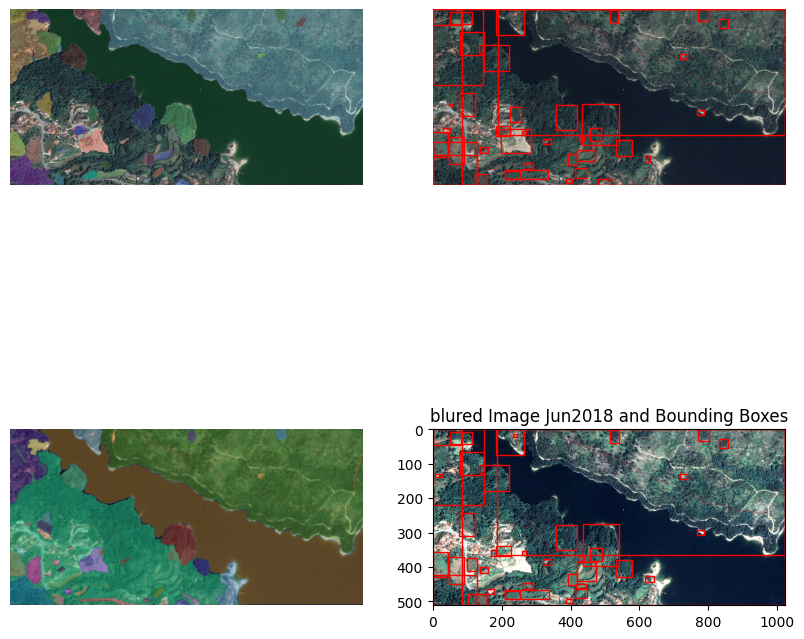

In [23]:
#plot mask of image 1
fig, axs = plt.subplots(2,2, figsize=(10,10))
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].imshow(image1)
show_anns(masks1,axs[0,0]) #,name_img1
#axs[0,0].set_title('Image {}'.format(name_img1)+ ' and segmented areas')#'Image in {}'.format(name_img)
axs[0,0].set_axis_off()
axs[0,1].imshow(image1)
plot_bb(masks1,axs[0,1])
axs[0,1].set_axis_off()
#axs[0,1].set_title('Image {}'.format(name_img1)+ ' and Bounding Boxes')
axs[1,0].imshow(img1_BlurGaussian)
show_anns(masks1_blur,axs[1,0]) #,name_img2
#axs[1,0].set_title('blured Image {}'.format(name_img1)+ ' and segmented areas')
axs[1,0].set_axis_off()
axs[1,1].imshow(img1_rescale)
plot_bb(masks1_rescaled,axs[1,1])
axs[1,1].set_title('blured Image {}'.format(name_img1)+ ' and Bounding Boxes')
plt.show()

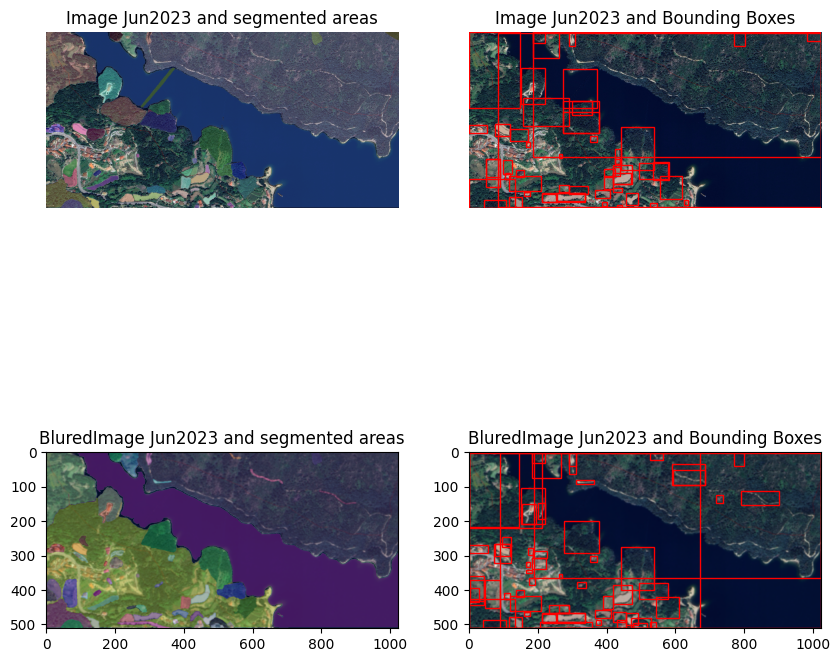

In [24]:
##plot mask of image 2
fig, axs = plt.subplots(2,2, figsize=(10,10))
#fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].imshow(image2)
show_anns(masks2,axs[0,0]) #,name_img1
axs[0,0].set_title('Image {}'.format(name_img2)+ ' and segmented areas')#'Image in {}'.format(name_img)
axs[0,0].set_axis_off()
axs[0,1].imshow(image2)
plot_bb(masks2,axs[0,1])
axs[0,1].set_title('Image {}'.format(name_img2)+ ' and Bounding Boxes')
axs[0,1].set_axis_off()
axs[1,0].imshow(img2_BlurGaussian)
show_anns(masks2_blur,axs[1,0]) #,name_img2
axs[1,0].set_title('Blured' + 'Image {}'.format(name_img2)+ ' and segmented areas')
axs[1,1].imshow(img2_BlurGaussian)
plot_bb(masks2_blur,axs[1,1])
axs[1,1].set_title('Blured' + 'Image {}'.format(name_img2)+ ' and Bounding Boxes')
plt.show()

## Evalute Masks

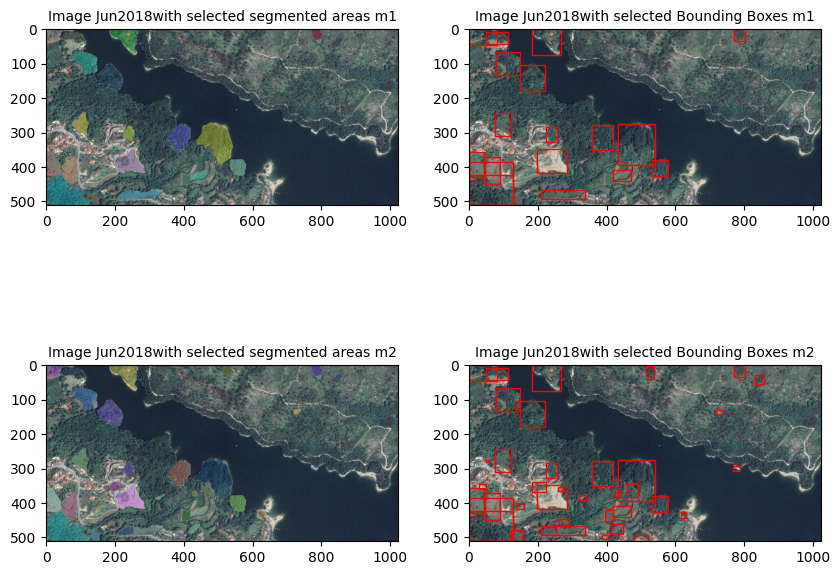

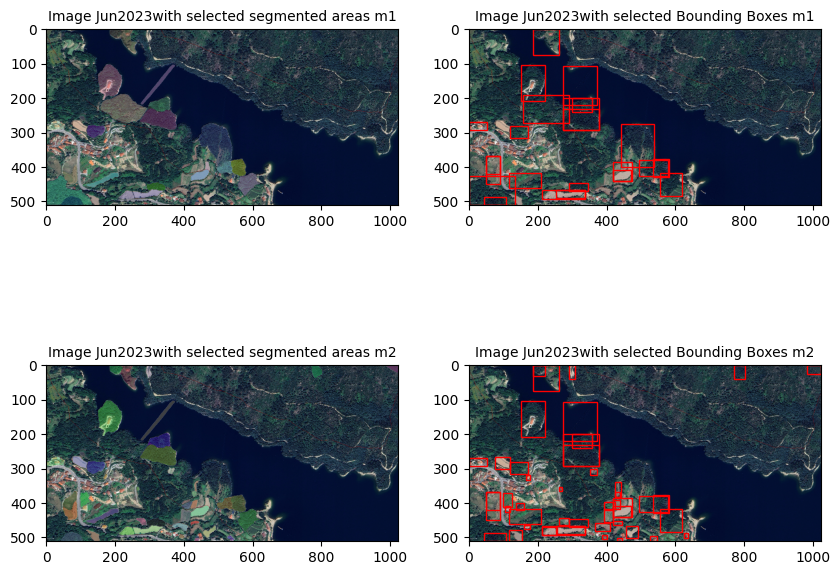

the number of segments for image1 after thresholding #1: 18
the number of segments for image1 after thresholding #2: 39
the number of segments for image2 after thresholding #1: 23
the number of segments for image2 after thresholding #2: 47


In [25]:
#sorted_mask1 = (sorted(masks_1, key=(lambda x: x['area']), reverse=True))

def select_segment(masks):
    #print("the area of bigest segment is:", max(region['area'] for region in masks))
    #print("the area of smallest segment is", min(region['area'] for region in masks))
    mean_areas = np.mean([region['area'] for region in masks])
    median_areas = np.median([region['area'] for region in masks])
  #  print("the mean value of segmented area is", mean_areas)
  #  print("the median value of segmented area is", median_areas)

    upper_quartile = np.percentile([region['area'] for region in masks], 75)
    lower_quartile = np.percentile([region['area'] for region in masks], 25)
    iqr = upper_quartile - lower_quartile
    thr_boxplot_u = upper_quartile +3*iqr
    thr_boxplot_d = lower_quartile -3*iqr
   # print("the upper threshold by boxplot:", thr_boxplot_u)
   # print("the lower threshold by boxplot:", thr_boxplot_d)

    threshold1= median_areas
    threshold2= mean_areas
    selected_segments_m = [region for region in masks if ((region['area'] > threshold1) & (region['area'] < threshold2))]
   # print("length of selected segments by M1 is:", len(selected_segments_m))

    selected_segments_b = [region for region in masks if ((region['area'] > thr_boxplot_d) & (region['area'] < thr_boxplot_u))]
   # print("length of selected segments by M2 is:", len(selected_segments_b))
    return selected_segments_m, selected_segments_b

def plot_selec_seg(img,selected_segments,selected_segments_b,name_img):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(10,8))
    ax1.imshow(img)
    show_anns(selected_segments,ax1)
    ax1.set_title('Image {}'.format(name_img)+ 'with selected segmented areas m1', fontsize=10)
    ax2.imshow(img)
    plot_bb(selected_segments,ax2)
    ax2.set_title('Image {}'.format(name_img)+ 'with selected Bounding Boxes m1', fontsize=10)
    ax3.imshow(img)
    show_anns(selected_segments_b,ax3)
    ax3.set_title('Image {}'.format(name_img)+ 'with selected segmented areas m2', fontsize=10)
    ax4.imshow(img)
    plot_bb(selected_segments_b,ax4)
    ax4.set_title('Image {}'.format(name_img)+ 'with selected Bounding Boxes m2', fontsize=10)
    plt.show()


sele_seg_m_1, sele_seg_b_1 = select_segment(masks1) #masks1_blur #masks1_equalized
plot_selec_seg(image1_GC, sele_seg_m_1,sele_seg_b_1,name_img1)


sele_seg_m_2, sele_seg_b_2 = select_segment(masks2) #masks2_GC #masks2_equalized
plot_selec_seg(image2, sele_seg_m_2,sele_seg_b_2,name_img2)



print("the number of segments for image1 after thresholding #1:",len(sele_seg_m_1))
print("the number of segments for image1 after thresholding #2:",len(sele_seg_b_1))

print("the number of segments for image2 after thresholding #1:",len(sele_seg_m_2))
print("the number of segments for image2 after thresholding #2:",len(sele_seg_b_2))



## change detection

length of reference mask is: 39
length of mask under evalurion 1 is: 47


Text(0.5, 1.0, 'Image Jun2023with selected Bounding Boxes m1')

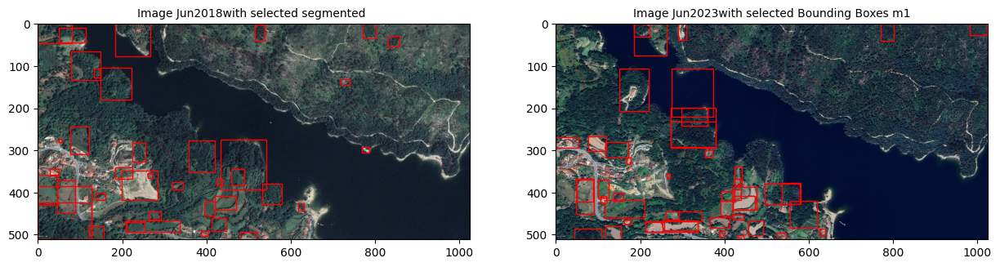

In [26]:
#Set masks uder evalution:
masks_ref = sorted(sele_seg_b_1, key=(lambda x: x['area']), reverse=True) #sele_seg_b_1 #sele_seg_m_1
#masks_ref = sele_seg_m_1 #sele_seg_b_1 #  sele_seg_m_21 #  mask1_blur # # #
image_ref = image1 #img2_BlurGaussian #
name_img_ref = name_img1
print("length of reference mask is:", len(masks_ref))

masks_eval_1 = sorted(sele_seg_b_2, key=(lambda x: x['area']), reverse=True) #sele_seg_b_2 #sele_seg_m_2
#masks_eval_1 = sele_seg_b_2 #sele_seg_b_2 #mask2_GC #masks2 #sele_seg_m_2 # mask2_blur #  masks2 #
image_eval_1 = image2 #img1_BlurGaussian #
name_img_eval_1 = name_img2
print("length of mask under evalurion 1 is:", len(masks_eval_1))



fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,20))
ax1.imshow(image1)
plot_bb(masks_ref,ax1)
ax1.set_title('Image {}'.format(name_img1)+ 'with selected segmented ', fontsize=10)
ax2.imshow(image2)
plot_bb(masks_eval_1,ax2)
ax2.set_title('Image {}'.format(name_img2)+ 'with selected Bounding Boxes m1', fontsize=10)


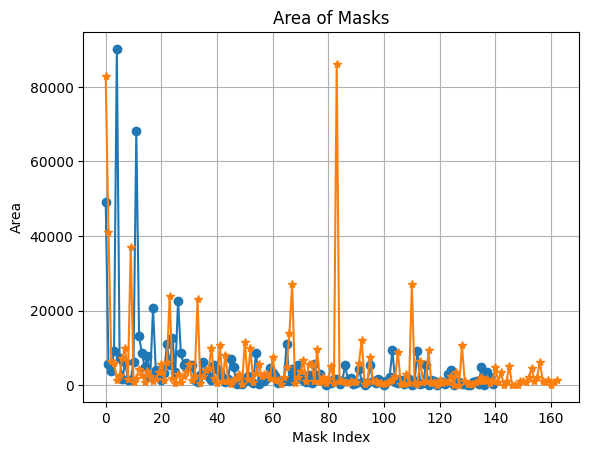

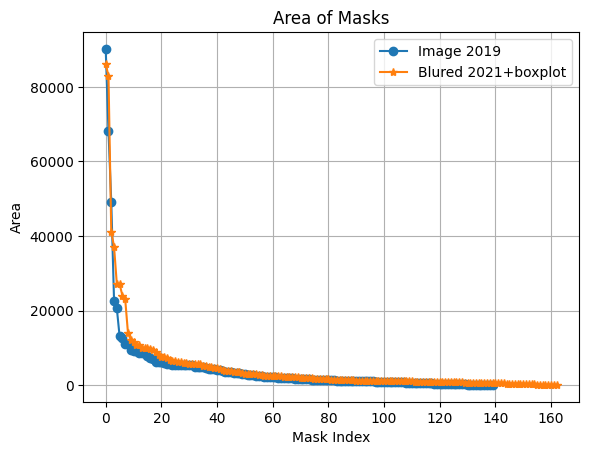

In [129]:
#print(masks_ref[key] for key = lambda x: x['area'])
#print("*"*120)
#print(masks_eval_1)
areas_ref = [item['area'] for item in masks1]
areas_eval_1 = [item['area'] for item in masks2]

# Plot the 'area' values
plt.plot(areas_ref, marker='o', linestyle='-')
plt.plot(areas_eval_1, marker='*', linestyle='-')

plt.xlabel('Mask Index')
plt.ylabel('Area')
plt.title('Area of Masks')
plt.grid(True)
plt.show()


areas_ref = [item['area'] for item in masks_ref]
areas_eval_1 = [item['area'] for item in masks_eval_1]

# Plot the 'area' values
plt.plot(areas_ref, marker='o', linestyle='-')
plt.plot(areas_eval_1, marker='*', linestyle='-')

plt.legend(['Image 2019', 'Blured 2021+boxplot','Blured 2023 +boxplot'])
plt.xlabel('Mask Index')
plt.ylabel('Area')
plt.title('Area of Masks')
plt.grid(True)
plt.show()

length masks in eval 1 before decreasing is: 58
length masks in eval 2 after decreasing is: 58


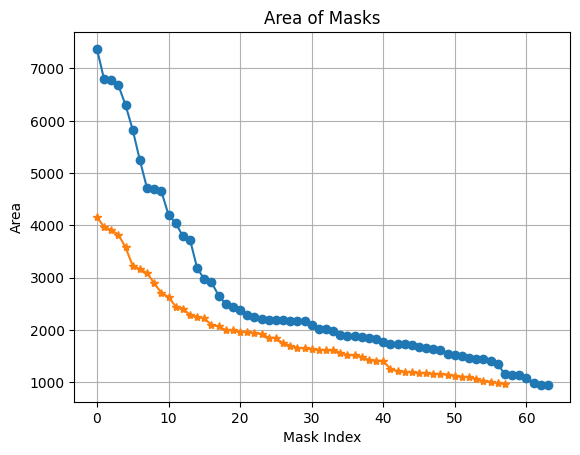

In [21]:
## remove areas bigger than maximum value of area in mask reference
max_mask_ref = max(region['area'] for region in masks_ref)
masks_eval_1_sele = [item for item in masks_eval_1 if item['area']<= max_mask_ref]
#masks_eval_2_sele = [item for item in masks_eval_2 if item['area']<= max_mask_ref]
print("length masks in eval 1 before decreasing is:",len(masks_eval_1))
print("length masks in eval 2 after decreasing is:",len(masks_eval_1_sele))


masks_eval_1 = masks_eval_1_sele


areas_ref = [item['area'] for item in masks_ref]
areas_eval_1 = [item['area'] for item in masks_eval_1]

# Plot the 'area' values
plt.plot(areas_ref, marker='o', linestyle='-')
plt.plot(areas_eval_1, marker='*', linestyle='-')

plt.xlabel('Mask Index')
plt.ylabel('Area')
plt.title('Area of Masks')
plt.grid(True)
plt.show()

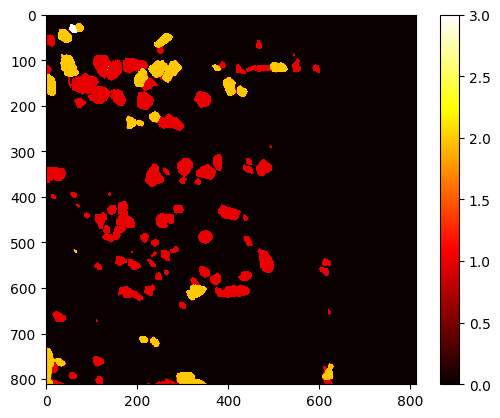

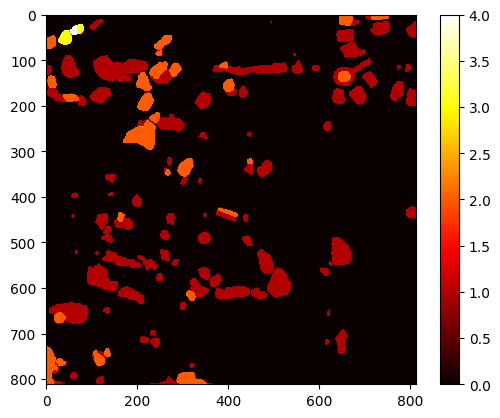

min and max in seg1 is: (0, 4)


NameError: name 'sum_matrix_2' is not defined

In [70]:
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

sorted_mask_ref = (sorted(masks_ref, key=(lambda x: x['area']), reverse=True))
masks_ref_selec = sorted_mask_ref[10:]

sorted_mask_eval_1 = (sorted(masks_eval_1, key=(lambda x: x['area']), reverse=True))
masks1_selec = sorted_mask_eval_1[5:]

#sorted_mask_eval_2 = (sorted(masks_eval_2, key=(lambda x: x['area']), reverse=True))
#masks2_selec = sorted_mask_eval_2[10:]

sum_matrix_ref = np.zeros_like(masks_ref_selec[0]['segmentation'], dtype=int) 
for item in masks_ref_selec:
    item['segmentation'] = item['segmentation'].astype(int)
    sum_matrix_ref += item['segmentation']
plt.imshow(sum_matrix_ref, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

sum_matrix_1 = np.zeros_like(masks1_selec[0]['segmentation'], dtype=int) 
for item in masks1_selec:
    item['segmentation'] = item['segmentation'].astype(int)
    sum_matrix_1 += item['segmentation']
plt.imshow(sum_matrix_1, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()


print("min and max in seg1 is:",(np.min(sum_matrix_1),np.max(sum_matrix_1)))


Matrixx1 =np.zeros((sum_matrix_1.shape[0],sum_matrix_1.shape[0]), dtype =int)##dtype =int
Matrixx2 =np.zeros((sum_matrix_1.shape[0],sum_matrix_1.shape[0]), dtype =int)##dtype =int
for i in range(sum_matrix_1.shape[0]):
    for j in range(sum_matrix_1.shape[1]):
        value1 = sum_matrix_1[i, j]
        value2 = sum_matrix_2[i, j]
        if value1 == value2:
            break
        elif value1 < value2:
            Matrixx1[i,j]=1 #'True'
            # print(f'Matrix 1 has zero at position ({i}, {j})')
        elif value2 < value1:
            #print(f'Matrix 2 has zero at position ({i}, {j})')
            Matrixx2[i,j]=1 #'True'

diff_seg_1 = sum_matrix_ref-sum_matrix_1

#print((np.where(Matrixx1==1)))
#print("***********")
#print((np.where(Matrixx2==1)))


#cmap = plt.cm.get_cmap('viridis', len(np.unique(diff_seg)))
#cmap = LinearSegmentedColormap.from_list('custom_colormap', ['#000000', 'blue', 'red'])

#cmap_colors = [(1, 1, 1), (0, 0, 0), (0, 0, 1), (1, 0, 0)]  # White, Black, Blue, Red
#cmap = LinearSegmentedColormap.from_list('custom_colormap', cmap_colors, N=256)


cmap = 'viridis' #'RdBu' #
fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10,5))
#plt.imshow(image1)
axs1.imshow(diff_seg_1, cmap=cmap, vmin=np.min(diff_seg_1), vmax=np.max(diff_seg_1))
axs2.imshow(diff_seg_2, cmap=cmap, vmin=np.min(diff_seg_2), vmax=np.max(diff_seg_2))
#plt.colorbar(label='Values')
plt.show()
'''
plt.figure(figsize=(5,5))
#plt.imshow(image1)
plt.imshow(Matrixx1, cmap=cmap, vmin=np.min(Matrixx1), vmax=np.max(Matrixx1)) #np.ma.masked_where(Matrixx1 == 0, Matrixx1)
plt.show()

plt.figure(figsize=(5,5))
#plt.imshow(image2)
plt.imshow(np.ma.masked_where(Matrixx2 == 0, Matrixx2), cmap=cmap, vmin=np.min(Matrixx2), vmax=np.max(Matrixx2))
#plt.imshow(Matrixx2, cmap=cmap, vmin=np.min(diff_seg), vmax=np.max(diff_seg))
plt.show()
'''
def create_cover(image, matrix):
    beta= 0.7
    gamma =0
    alpha = 0.3
    image_with_cover = image.copy()
    row,col = np.where(matrix>=1)
    specific_region = image_with_cover[row,col]
    cover_color = [173, 216, 230]
    cover_image = np.full_like(specific_region, cover_color)
    blended_image = cv2.addWeighted(specific_region, alpha, cover_image, beta, gamma)
    image_with_cover[row, col] = blended_image

    row2,col2 = np.where(matrix<=-1)
    specific_region2 = image_with_cover[row2,col2]
    cover_color2 = [213, 216, 130]
    cover_image2 = np.full_like(specific_region2, cover_color2)
    blended_image2 = cv2.addWeighted(specific_region2, alpha, cover_image2, beta, gamma)
    image_with_cover[row2, col2] = blended_image2
    
    return image_with_cover

def plot_mask_sele(mask_sele,ax):
    img = np.ones((mask_sele.shape[0], mask_sele.shape[1], 4))
    img[:,:,3] = 0
    m = mask_sele
    color_mask = np.concatenate([np.random.random(3), [0.1]]) #
    img[m] = color_mask
   #print(len(img))
    ax.imshow(img)

image1_with_cover = create_cover(image_eval_1, diff_seg_1)
fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10,10))
#axs1.imshow(image1)
axs1.imshow(image1_with_cover) 
axs2.imshow(sum_matrix_1)
#plot_mask_sele(Matrixx2,axs2) 
plt.show()

cv2.imwrite("chang_Dec.png",image1_with_cover)
image2_with_cover = create_cover(image_eval_2, diff_seg_2)
fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10,10))
#axs1.imshow(image1)
axs1.imshow(image2_with_cover) 
axs2.imshow(sum_matrix_2)
#plot_mask_sele(Matrixx2,axs2) 
plt.show()

data1 = diff_seg_1.flatten()
data2 = diff_seg_2.flatten()
fig, (axs1,axs2) = plt.subplots(1,2, figsize=(10,5))
axs1.hist(data1, bins=30, color='blue', edgecolor='black')
axs2.hist(data2, bins=30, color='blue', edgecolor='black')
plt.show()

#print("Sum of 'segmentation' matrices:", sum_matrix)
df = pd.DataFrame(Matrixx1)
df.to_csv('Matrixx1.csv', index=False)

#print((np.count_nonzero(sum_matrix_1==np.min(sum_matrix_1))))



In [ ]:
cv2.imwrite("chang_Jan2023.png",image2_with_cover)

In [ ]:
print(np.max(sum_matrix_ref))

In [ ]:
'''
i=1
seg01 = sele_seg_m_1[i]['segmentation']
first_true_indices = np.where(seg01)
first_true_row, first_true_col = first_true_indices[0][0], first_true_indices[1][0]
print(first_true_row)
print(first_true_col)

print(selected_segments1[i]['bbox'])
'''

In [ ]:
## SIFT is Scale-invariant feature transform
sift = cv2.SIFT_create()

# Detect key points and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(image_ref, None)
keypoints2, descriptors2 = sift.detectAndCompute(image_eval_1, None)

matcher = cv2.FlannBasedMatcher()
matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test to find good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw matches on the images
result_image = cv2.drawMatches(image_ref, keypoints1, image_eval_1, keypoints2, good_matches, None)

# Display the result
plt.figure(figsize=(10,10))
plt.imshow(result_image)
plt.show()

In [22]:
#Plot selected mask
def show_selec_anns(anns, random_seed=100): 
    if len(anns) == 0:
        return
    np.random.seed(random_seed)
    #sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((anns['segmentation'].shape[0], anns['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask

In [144]:
def localsearch_IOU (mask2,box1):
    '''
    if box1[0] <box1[2]//4: 
        xA=0
    else:
        xA = box1[0] - box1[2]//4
    if box1[1]< box1[3]//4:
        yA=0
    else:
        yA = box1[1] - box1[3]//4
    
    xB = box1[0] + 5*box1[2]//4
    yB = box1[1] + 5*box1[3]//4
    '''
    
    xA = box1[0]
    xB = box1[0] +box1[2]
    yA = box1[1]
    yB = box1[1]+box1[3]
    
    result_oneArea = {}
    result_local_IOU =[]
    for mask in mask2:
        box2 = mask['bbox']
        
       # if (box2[0] >=xA &  box2[1]] >= yA) & (box2[0]+box2[2]) <=xB & (box2[1]+box2[3]) <= yB:
        if (xA <= box2[0] <= xB and xA <= (box2[0]+box2[2]) <= xB) and (yA <= box2[1] <= yB and yA <= (box2[1]+box2[3]) <= yB):

                print('xywh in bbox_eval:',[box2[0],box2[1],box2[2],box2[3]])
                print("compute iou by considering bounding boxes")
                x11 = max(box1[0], box2[0])
                y11 = max(box1[1], box2[1])
                x22 = min(box1[0] + box1[2], box2[0] + box2[2])
                y22 = min(box1[1] + box1[3], box2[1] + box2[3])

                width_inter = max(0, x22 - x11)
                height_inter = max(0, y22 - y11)

                area_inter = width_inter * height_inter
                area_1 = box1[2] * box1[3]
                area_2 = box2[2] * box2[3]

                area_union = area_1 + area_2 - area_inter

                iou = area_inter / max(area_union, 1e-10)  # To avoid division by zero
                result_oneArea['segmentation'] = mask['segmentation']
                result_oneArea['bbox'] = mask['bbox']
                result_oneArea['IOU'] = iou
            
                print('IOU is',result_oneArea['IOU'])
                result_local_IOU.append(result_oneArea)
                #cv2.rectangle(image2, (box2[0], box2[1]), (box2[0] + box2[2], box2[1] + box2[3]), (0, 0, 255), 2)
                fig, axs = plt.subplots(1)
                fig = plt.figure(figsize=(10, 10))
                fig.set_figheight(10)
                fig.set_figwidth(10)
                #axs.rcParams['figure.figsize'] = (20, 20)
                axs.imshow(image_ref)
                rect2 = patches.Rectangle((box2[0], box2[1]), box2[2], box2[3], linewidth=2, edgecolor='b', facecolor='none')
                axs.add_patch(rect2)
                rect = patches.Rectangle((box1[0], box1[1]), box1[2], box1[3], linewidth=2, edgecolor='r', facecolor='none')
                axs.add_patch(rect)
                plt.show()
        else:
            result_oneArea['IOU'] ='null'

    
    return result_local_IOU
              
       

In [ ]:

for mask_eval in masks_eval_1:
   # fig, axs = plt.subplots(1)
    #fig.set_figheight(20)
   # fig.set_figwidth(20)
    box_eval = mask_eval['bbox']
    print('*********')
    print('xywh in bbox_ref is:', [box_eval[0],box_eval[1],box_eval[2],box_eval[3]])
    #print(mask1['segmentation'])
    #axs.imshow(image_ref) #cv2.cvtColor(image_ref, cv2.COLOR_BGR2RGB)d
    #rect = patches.Rectangle((box_ref[0], box_ref[1]), box_ref[2], box_ref[3], linewidth=2, edgecolor='r', facecolor='none')
    #axs.add_patch(rect)
    result_one = localsearch_IOU (masks_ref,box_eval)
    #plt.axis('off')
    #axs[1].imshow(image_eval)
    #plt.show() 
    #print(result_one)



IoU: (array([ 0,  0,  0, ..., 38, 38, 38]), array([ 0,  1,  2, ..., 44, 45, 46]))
(39, 47)


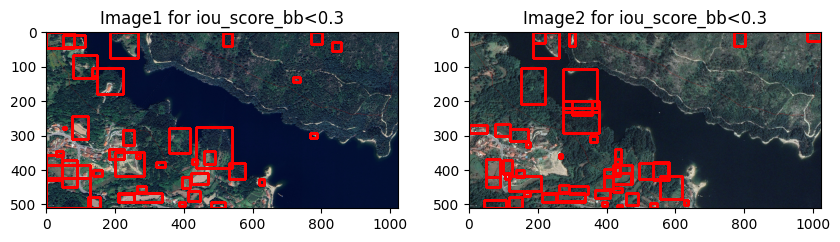

In [27]:
def calculate_iou_bb(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[0] + boxA[2], boxB[0] + boxB[2])
    yB = min(boxA[1] + boxA[3], boxB[1] + boxB[3])
    width_inter = max(0, xB - xA)
    height_inter = max(0, yB - yA)
    area_inter = width_inter * height_inter
    area_A = boxA[2] * boxA[3]
    area_B = boxB[2] * boxB[3]
    area_union = area_A + area_B - area_inter
    iou = area_inter / max(area_union, 1e-10)  # To avoid division by zero
    return iou


mask1_selected_IOU_bb =[]
mask2_selected_IOU_bb =[]
iou_score_bb = np.zeros((len(masks_ref),len(masks_eval_1)))
for i, mask1 in enumerate(masks_ref):
    for j, mask2 in enumerate(masks_eval_1):
        iou_score_bb[i, j] = calculate_iou_bb(mask1['bbox'], mask2['bbox'])
        if iou_score_bb[i,j]<0.3:
            mask1_selected_IOU_bb.append(mask1)
            mask2_selected_IOU_bb.append(mask2)


print(f"IoU: {np.where(iou_score_bb==0)}")
print(iou_score_bb.shape)


fig, axs = plt.subplots(1,2, figsize=(10, 5))
axs[0].imshow(image_eval_1)
plot_bb(mask1_selected_IOU_bb,axs[0])
axs[0].set_title('Image1 for iou_score_bb<0.3')

axs[1].imshow(image_ref)
plot_bb(mask2_selected_IOU_bb, axs[1])
axs[1].set_title('Image2 for iou_score_bb<0.3')
plt.show()

import pandas as pd
df = pd.DataFrame(iou_score_bb)
df.to_csv('iou_score_bb.csv', index=False)

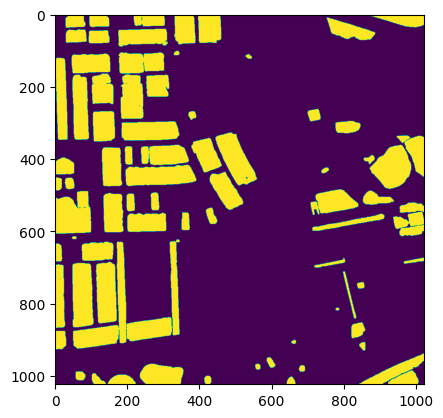

In [150]:

unmatch_seg2 = np.any(np.array([xx['segmentation'] for xx in mask1_selected_IOU_bb]),axis=0)
plt.imshow(unmatch_seg2)

In [28]:
def match_objects_bb(segments1, segments2, iou_threshold):
    matches = []
    mached_seg1 =[]
    mached_seg2 = []
    unmatch_seg1=[]
    
    for idx1, seg1 in enumerate(segments1):
        bbox1 = seg1['bbox']

        best_match = None
        best_iou = 0.0

        for idx2, seg2 in enumerate(segments2):
            #print(len(segments2))
            bbox2 = seg2['bbox']
            iou = calculate_iou_bb(bbox1, bbox2)
           # print(iou)
            if iou > best_iou:
                best_iou = iou
                best_match = idx2
                seg_match = seg2
        if best_iou >= iou_threshold:
            #print(best_iou)
            matches.append((idx1, best_match))
            mached_seg2.append(seg_match)
            mached_seg1.append(seg1)
           # del segments2[best_match]
        else:
            unmatch_seg1.append(seg1)
          

    return matches,mached_seg1,mached_seg2,unmatch_seg1


In [29]:

matches_1,mached_bb_ref_1,mached_bb_eval_1,unmatch_bb_ref_1 = match_objects_bb(masks_ref,masks_eval_1, iou_threshold=0.4)

match_idx_ref_1 = [pair[0] for pair in matches_1]
match_idx_eval_1 = [pair[1] for pair in matches_1]
#unmatch_seg1 = list(filter(lambda pair: pair[0] not in match_idx1, enumerate(masks_1)))
#unmatch_seg1 = [segmen1 for index1, segmen1 in unmatch_seg1]
match_idx_eval_1 = sorted(list(set(match_idx_eval_1)))
unmatch_bb_eval_1 = list(filter(lambda pair2: pair2[0] not in match_idx_eval_1, enumerate(masks_eval_1)))
unmatch_bb_eval_1 = [segmen2 for index2, segmen2 in unmatch_bb_eval_1]




In [30]:

print('len of masks in Image {}'.format(name_img_eval_1), len(masks_eval_1))
print('len of unmatches in Image {}'.format(name_img_eval_1),len(unmatch_bb_eval_1))
print('len of matches in in Image {}'.format(name_img_eval_1),len(match_idx_eval_1))


len of masks in Image Jun2023 47
len of unmatches in Image Jun2023 31
len of matches in in Image Jun2023 16


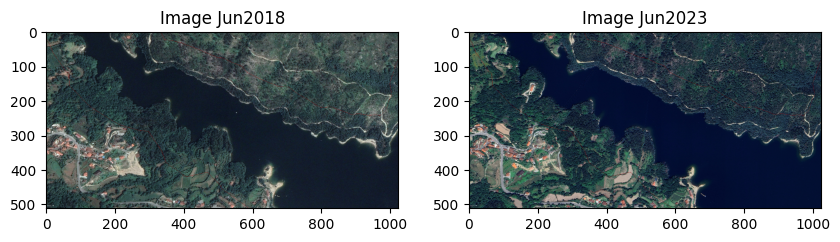

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 1024, 4)


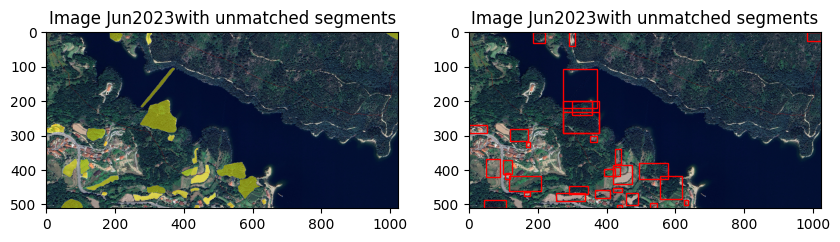

In [31]:
def show_anns2(anns, ax): #,name_img
    if len(anns) == 0:
        return
   # np.random.seed(random_seed)
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
   # print(len(sorted_anns))
   # ax = plt.gca()
    #ax.set_autoscale_on(False)
    color_cover =[255, 255, 0]
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    print(img.shape)
    img[:,:,3] = 0
    for ann in anns:
        m = ann['segmentation']
        m = np.array(m, dtype=bool)
        color_mask = np.concatenate([color_cover, [.5]])
        img[m] = color_mask
    ax.imshow(img)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_ref)
ax1.set_title('Image {}'.format(name_img_ref))
ax2.imshow(image_eval_1)
ax2.set_title('Image {}'.format(name_img_eval_1))
plt.show()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_eval_1)
show_anns2(unmatch_bb_eval_1,ax1)
ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_1)
plot_bb(unmatch_bb_eval_1,ax2)
ax2.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
plt.show()




[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


(512, 1024)

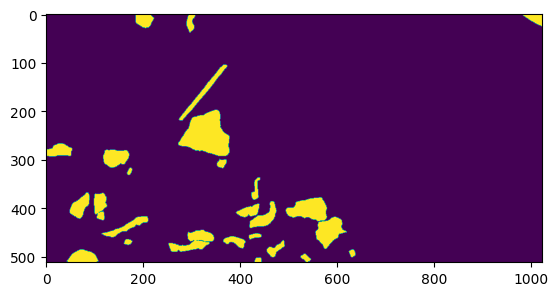

In [33]:
unmatch_seg = np.any(np.array([xx['segmentation'] for xx in unmatch_bb_eval_1]),axis=0)
plt.imshow(unmatch_seg)

print(unmatch_seg)
np.shape(unmatch_seg)

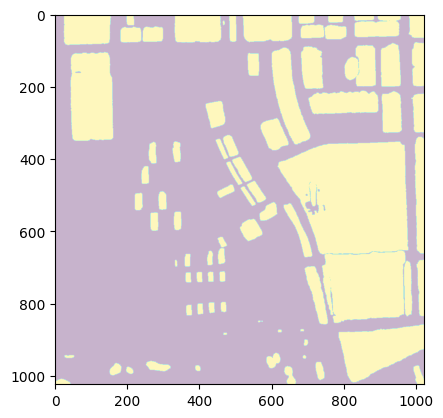

In [135]:
GT_path = '/home/dock/project_CD_jupyter/my_project_env/Meta_repository/test_LEVIR_CD/label/test_80.png'
GT = cv2.imread(GT_path, cv2.IMREAD_UNCHANGED)
#plt.imshow(GT[:,:,0])

#plt.imshow(np.any(GT, axis=2), cmap='jet')
plt.imshow(unmatch_seg, alpha=0.3)

#Ground_t = ((GT[:,:,2] > 0).astype(bool))


from sklearn.metrics import confusion_matrix

#cm = confusion_matrix(np.any(GT, axis=2).flatten(), unmatch_seg.flatten())
#cm

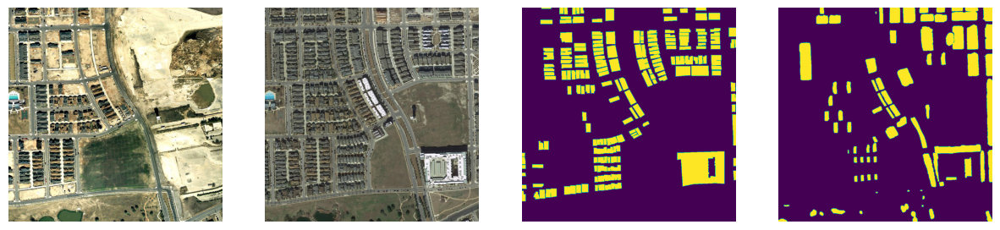

In [143]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(15,15))
ax1.imshow(image_ref)
ax1.set_axis_off()
#ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_1)
ax2.set_axis_off()
ax3.imshow(GT) #(np.any(GT, axis=2))
ax3.set_axis_off()
ax4.imshow(unmatch_seg)
ax4.set_axis_off()
plt.show()

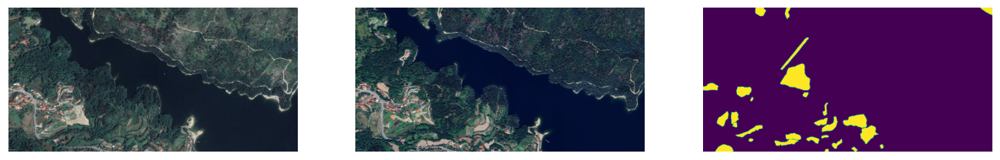

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,15))
ax1.imshow(image_ref)
ax1.set_axis_off()
#ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_1)
ax2.set_axis_off()
ax3.imshow(unmatch_seg)
ax3.set_axis_off()
plt.show()

In [103]:
#confusion_matrix = confusion_matrix(np.array(Ground_t.astype(int)), np.array(unmatch_seg.astype(int)))



def calculate_metrics(confusion_matrix):
    confusion_matrix = np.array(confusion_matrix)
    TP = confusion_matrix[1, 1]
    FP = confusion_matrix[0, 1]
    FN = confusion_matrix[1, 0]
    TN = confusion_matrix[0, 0]
    
    # Calculate accuracy
    accuracy = (TP + TN) / (TP + FP + FN + TN)
    
    # Calculate precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    
    # Calculate recall (sensitivity)
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    
    # Calculate F1 score
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    # Calculate specificity (True Negative Rate)
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    # Calculate False Positive Rate (FPR)
    fpr = FP / (FP + TN) if (FP + TN) > 0 else 0

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'specificity': specificity,
        'fpr': fpr
    }


metrics = calculate_metrics(cm)
for metric, value in metrics.items():
    print(f"{metric}: {value:.2f}")
  

accuracy: 0.96
precision: 0.21
recall: 0.82
f1_score: 0.34
specificity: 0.96
fpr: 0.04


In [ ]:
print("the area of bigest segment is:", max(region['area'] for region in unmatch_seg_eval_1))
print("the area of smallest segment is", min(region['area'] for region in unmatch_seg_eval_1))
#sorted_without_match2 = (sorted(without_match2, key=(lambda x: x['area']), reverse=True))


In [ ]:
def match_objects_chang_bb(segments1, segments2, iou_threshold):
    matches = []
    mached_seg1 =[]
    mached_seg2 = []
    unmatch_seg1=[]
    
    for idx1, seg1 in enumerate(segments1):
        bbox1 = seg1['bbox']
        xA = bbox1[0] - bbox1[2]/2
        xB = bbox1[0] + 3*bbox1[2]/2
        yA = bbox1[1] - bbox1[3]/2
        yB = bbox1[1] + 3* bbox1[3]/2
        best_match = None
        best_iou = 0.0

        for idx2, seg2 in enumerate(segments2):
            bbox2 = seg2['bbox']
            if (xA <= bbox2[0] <= xB) and (yA <= bbox2[1] <= yB):
                iou = calculate_iou_bb(bbox1, bbox2)
                if iou > best_iou:
                    best_iou = iou
                    best_match = idx2
                    seg_match = seg2
            if best_iou >= iou_threshold:
            #print(best_iou)
               matches.append((idx1, best_match))
               mached_seg2.append(seg_match)
               mached_seg1.append(seg1)
             # del segments2[best_match]
            else:
               unmatch_seg1.append(seg1)
          

    return matches,mached_seg1,mached_seg2,unmatch_seg1

matches_1,mached_bb_ref_1,mached_bb_eval_1,unmatch_bb_ref_1 = match_objects_chang_bb(masks_ref,masks_eval_1, iou_threshold=0.5)
match_idx_ref_1 = [pair[0] for pair in matches_1]
match_idx_eval_11 = [pair[1] for pair in matches_1]
match_idx_eval_11 = sorted(list(set(match_idx_eval_11)))
unmatch_bb_eval_11 = list(filter(lambda pair2: pair2[0] not in match_idx_eval_11, enumerate(masks_eval_1)))
unmatch_bb_eval_11 = [segmen2 for index2, segmen2 in unmatch_bb_eval_11]

matches_22,mached_bb_ref_2,mached_bb_eval_2,unmatch_bb_ref_2 = match_objects_bb(masks_ref,masks_eval_2, iou_threshold=0.5)
match_idx_ref_22 = [pair[0] for pair in matches_22]
match_idx_eval_22 = [pair[1] for pair in matches_22]
match_idx_eval_22 = sorted(list(set(match_idx_eval_22)))
unmatch_bb_eval_22 = list(filter(lambda pair2: pair2[0] not in match_idx_eval_22, enumerate(masks_eval_2)))
unmatch_bb_eval_22 = [segmen2 for index2, segmen2 in unmatch_bb_eval_22]

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_eval_1)
show_anns2(unmatch_bb_eval_11,ax1)
ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_2)
show_anns2(unmatch_bb_eval_22,ax2)
ax2.set_title('Image {}'.format(name_img_eval_2)+ 'with unmatched segments')
plt.show()

## based on segments:

In [ ]:
sorted_r_mask2 = (sorted(selected_segments2, key=(lambda x: x['area']), reverse=False))
sorted_r_mask1 = (sorted(selected_segments1, key=(lambda x: x['area']), reverse=False))
#for masks in masks_ref:
segment = sorted_r_mask2[0]['segmentation']
indices = np.where(segment)
x11, y11 = (indices[0][0], indices[1][0]) #position_of_first_true in segmented area #1
x22, y22 = (indices[0][-1], indices[1][-1]) #position_of_last_true in segmented area #
d_hor = x22-x11
d_ver = y22-y11
x1_l = x11 - d_hor//4
x2_l = x22 + d_hor//4
y1_l = y11 - d_ver//4
y2_l = y22 + d_ver//4
print([x11,x22])
print([x1_l,x2_l])
print([y11,y22])
print([y1_l,y2_l])


In [ ]:
## remove big segment among two segments with big overlap (iou) in each image
import numpy as np
from skimage.measure import label, regionprops
'''
def remove_segment_with_highest_overlap(image, mask):
    image =cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    labeled_mask = label(image)
    print(labeled_mask)
    # Label the segments in the mask
    labeled_mask = label(image)
    # Calculate region properties
    regions = regionprops(labeled_mask)
    
    max_iou = 0
    segment_to_remove = None
    
    # Iterate through each pair of segments
    for region in regions:
        # Calculate area of current segment
        area = region.area
        # Create a mask for the current segment
        segment_mask = labeled_mask == region.label
        # Calculate IOU with all other segments
        for other_region in regions:
            if other_region != region:
                other_segment_mask = labeled_mask == other_region.label
                intersection = np.logical_and(segment_mask, other_segment_mask).sum()
                union = np.logical_or(segment_mask, other_segment_mask).sum()
                iou = intersection / union
                if iou > max_iou:
                    max_iou = iou
                    segment_to_remove = region.label
    
    # Remove the segment with the largest area
    if segment_to_remove:
        image[labeled_mask == segment_to_remove] = 0
    
    return image

updated_image = remove_segment_with_highest_overlap(image1, masks_ref)
'''

In [ ]:
print(len(masks_ref))
fig, ax1 = plt.subplots(1,1, figsize=(10,10))
ax1.imshow(image_ref)
plot_bb(masks_ref,ax1)
plt.show()

In [ ]:
def remove_segment_with_highoverlap(masks, max_iou):
    # Create a new list to store the masks to be removed
    masks_to_remove = []
    
    for i, mask1 in enumerate(masks):
        for j, mask2 in enumerate(masks):
            if i != j:  # Ensure that we're not comparing the mask with itself
                iou_score, _ = calculate_iou_seg(mask1['segmentation'], mask2['segmentation'])
                if iou_score > max_iou:
                    masks_to_remove.append(i)
                    break 

    for index in sorted(masks_to_remove, reverse=True):
        del masks[index]

    return masks




In [ ]:
max_iou = 0.6
masks_refff = masks_ref
updated_masks = remove_segment_with_highoverlap(masks_refff, max_iou)   

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_ref)
plot_bb(masks_ref,ax1)
ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_ref)
plot_bb(updated_masks,ax2)
ax2.set_title('Image {}'.format(name_img_eval_2)+ 'with unmatched segments')
plt.show()

print(len(updated_masks))


In [ ]:
# plot boxplots
def plot_bb_area(mask,Area,ax):
    i=0
    for box in mask:
        boxx = box['bbox']
        area = str (Area[i])
        i+=1
        x, y, w, h = boxx
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.text(x + w/2, y + h/2, area, ha='center', va='center', color='blue', fontsize=12)
        ax.add_patch(rect)

In [ ]:
def calculate_iou_seg(segmentation1, segmentation2):
    intersection = np.logical_and(segmentation1, segmentation2)
    union = np.logical_or(segmentation1, segmentation2)
    iou = np.sum(intersection) / np.sum(union)
    sum_intersec= np.sum(intersection)
    return iou,sum_intersec

def DICE_COE(segmentation1, segmentation2):
    intersect = np.sum(segmentation1*segmentation2)
    fsum = np.sum(segmentation1)
    ssum = np.sum(segmentation2)
    #print(ssum)
    dice = (2 * intersect ) / (fsum + ssum)
    dice = np.mean(dice)
    dice = round(dice, 3) # for easy reading
    return dice    

iou_score_eval1 = np.zeros((len(masks_ref),len(masks_eval_1)))
Dices_eval1 = np.zeros((len(masks_ref), len(masks_eval_1)))
sum_intersec_eval1 = np.zeros((len(masks_ref),len(masks_eval_1)))
mask1_selected_IOU =[]
mask2_selected_IOU =[]
matched_seg_ref1 =[]
matched_seg_eval_1 =[]
Area_refeval_1 =[]
for i, mask1 in enumerate(masks_ref):
    for j, mask2 in enumerate(masks_eval_1):
        iou_score_eval1[i,j], sum_intersec_eval1[i,j] = calculate_iou_seg(mask1['segmentation'], mask2['segmentation'])
        Dices_eval1[i,j] = DICE_COE(mask1['segmentation'], mask2['segmentation'])
        hybrid =1/2* (iou_score_eval1[i,j]+Dices_eval1[i,j]) #the trade-off between precision and recall 
        if hybrid > 0.5:
            matched_seg_ref1.append(mask1)
            matched_seg_eval_1.append(mask2)
            Area_refeval_1.append(mask1['area']-mask2['area'])
        if iou_score_eval1[i,j]<0.4:
            mask1_selected_IOU.append(mask1)
            mask2_selected_IOU.append(mask2)
                        

print(len(matched_seg_ref1))
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
im1 = axs[0].imshow(iou_score_eval1, cmap='viridis', interpolation='nearest')
axs[0].set_title('IOU score based on segments')
cbar1 = fig.colorbar(im1, ax=axs[0])
im2 = axs[1].imshow(iou_score_bb, cmap='viridis', interpolation='nearest')
axs[1].set_title('IOU score based on bounding boxes')
cbar2 = fig.colorbar(im2, ax=axs[1])
plt.tight_layout()

print(Dices_eval1-iou_score_eval1)
#Dices_loss = 1-Dices

#print(mask2_selected_IOU)

fig, axs = plt.subplots(1,2, figsize=(10, 5))
axs[0].imshow(image_eval_1)
plot_bb_area(matched_seg_eval_1,Area_refeval_1,axs[0])
axs[0].set_title('Bounding Boxes of {}'.format(name_img_eval_1)+ 'with hybrid>0.5')

axs[1].imshow(image_ref)
plot_bb_area(matched_seg_ref1,Area_refeval_1, axs[1])
axs[1].set_title('Bounding Boxes of {}'.format(name_img_ref)+ 'with hybrid>0.5')
plt.show()

df = pd.DataFrame(iou_score_eval1)
df.to_csv('iou_score.csv', index=False)

df = pd.DataFrame(Dices_eval1)
df.to_csv('Dices.csv', index=False)

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10, 5))
axs[0].imshow(image_ref)
plot_bb(matched_seg_ref1,axs[0])
axs[0].set_title('Bounding Boxes of {}'.format(name_img_ref)+ 'with hybrid>0.5')

axs[1].imshow(image_eval_1)
plot_bb(matched_seg_eval_1, axs[1])
axs[1].set_title('Bounding Boxes of {}'.format(name_img_eval_1)+ 'with hybrid>0.5')
plt.show()

In [ ]:
def match_objects_seg(segments1, segments2, iou_threshold):
    matched_seg1 =[]
    matched_seg2 = []

    for idx1, seg1 in enumerate(segments1):
        segment1 = seg1['segmentation']

        best_match = None
        best_iou = 0.0

        for idx2, seg2 in enumerate(segments2):
            segment2 = seg2['segmentation']
            iou,sum_intersec = calculate_iou_seg(segment1, segment2)
            if iou > best_iou:
                best_iou = iou
                best_match = idx2
                seg_match = seg2
        if best_iou >= iou_threshold:
            matches.append((idx1, best_match))
            matched_seg2.append(seg_match)
            matched_seg1.append(seg1)
        else:
            unmatch_seg1.append(seg1)

    return matches,matched_seg1,matched_seg2,unmatch_seg1

In [ ]:
matches_1,mached_seg_ref_1,mached_seg_eval_1,unmatch_seg_ref_1 = match_objects_bb(masks_ref,masks_eval_1, iou_threshold=0.3)

match_idx_ref_1 = [pair[0] for pair in matches_1]
match_idx_eval_1 = [pair[1] for pair in matches_1]
#unmatch_seg1 = list(filter(lambda pair: pair[0] not in match_idx1, enumerate(masks_1)))
#unmatch_seg1 = [segmen1 for index1, segmen1 in unmatch_seg1]
match_idx_eval_1 = sorted(list(set(match_idx_eval_1)))
unmatch_seg_eval_1 = list(filter(lambda pair2: pair2[0] not in match_idx_eval_1, enumerate(masks_eval_1)))
unmatch_seg_eval_1 = [segmen2 for index2, segmen2 in unmatch_seg_eval_1]


matches_2,mached_seg_ref_2,mached_seg_eval_2,unmatch_seg_ref_2 = match_objects_bb(masks_ref,masks_eval_2, iou_threshold=0.2)
match_idx_ref_2 = [pair[0] for pair in matches_2]
match_idx_eval_2 = [pair[1] for pair in matches_2]
match_idx_eval_2 = sorted(list(set(match_idx_eval_2)))
unmatch_seg_eval_2 = list(filter(lambda pair2: pair2[0] not in match_idx_eval_2, enumerate(masks_eval_2)))
unmatch_seg_eval_2 = [segmen2 for index2, segmen2 in unmatch_seg_eval_2]


In [ ]:
#print(matches_seg)
print("len of matches:",len(mached_seg_ref_1))
print("len of unmatched segemnts in Image 1:", len(unmatch_seg_eval_1))
print("len of unmatched segemnts in Image 2:", len(unmatch_seg_eval_2))

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(10,10))
ax1.imshow(image_ref)
plot_bb(masks_ref,ax1)
ax1.set_title('Image {}'.format(name_img_ref))
ax2.imshow(image_eval_1)
plot_bb(masks_eval_1,ax2)
ax2.set_title('Image {}'.format(name_img_eval_1))
ax3.imshow(image_eval_2)
plot_bb(masks_eval_2,ax3)
ax3.set_title('Image {}'.format(name_img_eval_2))
plt.show()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_eval_1)
show_anns2(unmatch_seg_eval_1,ax1)
ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_2)
show_anns2(unmatch_seg_eval_2,ax2)
ax2.set_title('Image {}'.format(name_img_eval_2)+ 'with unmatched segments')
plt.show()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,10))
ax1.imshow(image_eval_1)
plot_bb(unmatch_seg_eval_1,ax1)
ax1.set_title('Image {}'.format(name_img_eval_1)+ 'with unmatched segments')
ax2.imshow(image_eval_2)
plot_bb(unmatch_seg_eval_2,ax2)
ax2.set_title('Image {}'.format(name_img_eval_2)+ 'with unmatched segments')
plt.show()


In [ ]:
print(f"max_IoU: {np.max(iou_score)}")
print(f"min_IoU: {np.min(iou_score)}")
iou_score2 =np.copy(iou_score)
iou_score2[iou_score<0.2] =0
iou_score2[(0.3<iou_score) & (iou_score<0.5)] =1
iou_score2[iou_score>0.5] =2
plt.plot(sum_intersec[:,3])
#print(iou_score2.shape)

row_indices, col_indices = np.where((0.3<iou_score) & (iou_score<0.5))
print(len(row_indices))
print((col_indices))
chang = (masks[row_indices[0]]['segmentation']).astype(int) -  (masks2[col_indices[0]]['segmentation']).astype(int)

detec_change =[]
for i, j in zip(row_indices, col_indices):
    print(i)
    print(j)
    print("******")
    segmentation_diff  = (masks[i]['segmentation']).astype(int) -  (masks2[j]['segmentation']).astype(int)
    print(np.where(segmentation_diff == -1))
    
    detec_change.append({'segmentation': segmentation_diff})

In [ ]:
## for plot
print(len(detec_change[2]['segmentation']))
plt.figure(figsize=(10,10))
#plt.imshow(image)

img = np.ones((detec_change[0]['segmentation'].shape[0], detec_change[0]['segmentation'].shape[1], 4))
blue_mask = np.zeros_like(image, dtype=np.uint8)
#print(blue_mask)
img[:,:,3] = 0
for ann in detec_change:
    m = ann['segmentation']
    blue_mask[m == 1] = [255, 0, 0]
    #blue_mask = np.zeros_like(m, dtype=np.uint8)
    #print(blue_mask)
    #color_mask = np.concatenate([np.random.random(3), [0.35]])
    #img[m] = color_mask
#plt.imshow(img)
'''
segmentations = np.array([item['segmentation'] for item in detec_change])
print(segmentations)
blue_mask = np.zeros_like(segmentations, dtype=np.uint8)
blue_mask[segmentations == 1] = [255, 0, 0]  # Set blue color where segmented_image is 1

# Create red mask for segments with value 2
red_mask = np.zeros_like(segmentations, dtype=np.uint8)
red_mask[segmentations == 2] = [0, 0, 255]  # Set red color where segmented_image is 2

# Combine the blue and red masks to get the final colored image
colored_image = cv2.addWeighted(blue_mask, 1, red_mask, 1, 0)


img = np.ones((detec_change[0]['segmentation'].shape[0], detec_change[0]['segmentation'].shape[1], 4))
img[:,:,3] = 0
#print(img)
for ann in detec_change:
    m = ann['segmentation']
    print(m[10])
    blue_mask = np.zeros_like(m, dtype=np.uint8)
   #print(blue_mask[m == 1])
    red_mask = np.zeros_like(m, dtype=np.uint8)
    
    blue_mask[m == 1] = [255, 0, 0]  # Set blue color where segmentation_mask is 1
    red_mask[m == -1] = [0, 0, 255]
    colored_image = blue_mask + red_mask
    img[m] = colored_image
    #colored_image = cv2.addWeighted(blue_mask, 1, red_mask, 1, 0)
plt.imshow(colored_image)
plt.axis('off')
plt.show() 
'''

In [ ]:
## Sørensen–Dice coefficient

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def np_hist_to_cv(np_histogram_output):
    counts, bin_edges = np_histogram_output
    return counts.ravel().astype('float32')
    
def calculate_histogram(image1,image2, mask1, mask2,method):
    # Calculate histogram of the pixels within the masked region
    masked_region1 = image1[mask1['segmentation']]
    
    flattened_region1 = masked_region1.flatten()
    histogram1 = cv2.calcHist ([masked_region1],[0], None,[256],[0,256]) 
    histogram1 = cv2.normalize(histogram1,histogram1,alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    
    masked_region2 = image2[mask2['segmentation']]
    flattened_region2 = masked_region2.flatten()
    histogram2 = cv2.calcHist ([masked_region2],[0], None,[256],[0,256]) 
    histogram2 = cv2.normalize(histogram2,histogram2,alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
   # _ = plt.hist(flattened_region, bins='auto')
    #plt.show()

    #correlation_result = cv2.compareHist(np_hist_to_cv(histogram1), np_hist_to_cv(histogram2), method)
    correlation_result = cv2.compareHist(histogram1, histogram2, method)
    print(f"correlation between histograms:{correlation_result:.4f}")

    return correlation_result
   


# Calculate histograms for the segmented regions
#histogram1 =np.zeros(len(masks1))
method= cv2.HISTCMP_BHATTACHARYYA #cv2.cv.HISTCMP_CORREL
for idx1, seg1 in enumerate(masks1):
    for idx2, seg2 in enumerate(masks2):
         histogram1 = calculate_histogram(image1, image2, seg1, seg2, method)
         
    
    #print(masked_region.shape)
    #print(type(masked_region))
'''
histogram2 = calculate_histogram(image2, masks2)

# Compare histograms using correlation (other methods are available)
correlation_result = histogram_comparison(histogram1, histogram2, method=cv2.HISTCMP_CORREL)

# Display results
print(f"Histogram Correlation Result: {correlation_result}")

# Plot histograms for visualization
plt.subplot(2, 1, 1)
plt.title('Histogram for Image 1')
plt.plot(histogram1)

plt.subplot(2, 1, 2)
plt.title('Histogram for Image 2')
plt.plot(histogram2)

plt.show()
'''